In [1]:
import tensorflow as tf
import numpy as np
import matplotlib as mpl
import IPython.display as display
import PIL.Image
import os
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt

from utils.deepdreamvideo import DeepDreamVideo
from utils.guided_deepdream import GuidedDeepDream
from utils.guided_deepdream_tiledgradients import ImprovedGuidedDeepDream

2025-05-12 15:41:21.412506: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-05-12 15:41:21.423256: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1747057281.435266  597104 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1747057281.439035  597104 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1747057281.448858  597104 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking 

In [2]:
import optree
print(optree.__version__)


0.15.0


In [3]:
import tensorflow as tf
print("TensorFlow version:", tf.__version__)
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))
print("Devices available:", tf.config.list_physical_devices())

TensorFlow version: 2.19.0
Num GPUs Available:  1
Devices available: [PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'), PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


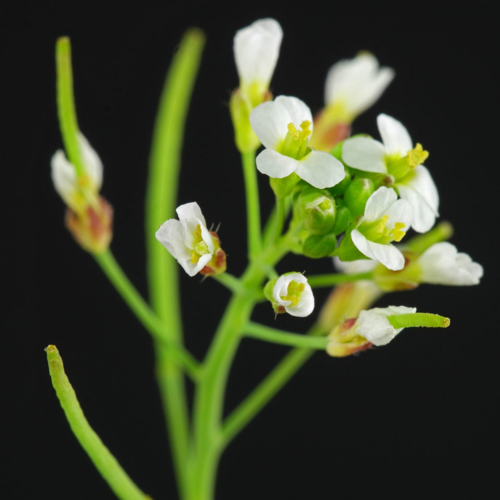

In [4]:
url = "https://pflanzenbestimmung.info/wp-content/uploads/2021/04/Arabidopsis-thaliana-4-1200x1200.jpg"

def download(url, max_dim=None):
  name = url.split('/')[-1]
  image_path = tf.keras.utils.get_file(name, origin=url)
  img = PIL.Image.open(image_path)
  if max_dim:
    img.thumbnail((max_dim, max_dim))
  return np.array(img)

# Normalize an image
def deprocess(img):
  img = 255*(img + 1.0)/2.0
  return tf.cast(img, tf.uint8)

# Display an image
def show(img):
  display.display(PIL.Image.fromarray(np.array(img)))

# Downsizing the image makes it easier to work with.
original_img = download(url, max_dim=500)
show(original_img)

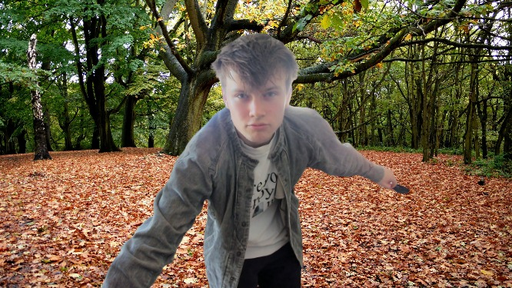

In [5]:
from PIL import Image

original_img = Image.open("pictures/forest_floor_background.jpg")

base_width = 512
w_percent = base_width / float(original_img.size[0])
h_size = int((float(original_img.size[1]) * float(w_percent)))

resized_img = original_img.resize((base_width, h_size), Image.Resampling.LANCZOS)

resized_img.show()

original_img = resized_img
original_img.save('mountains_resized.jpg')


In [22]:
def calc_loss(img, model):
  img_batch = tf.expand_dims(img, axis=0)
  layer_activations = model(img_batch)
  if len(layer_activations) == 1:
    layer_activations = [layer_activations]

  losses = []
  for act in layer_activations:
    loss = tf.math.reduce_mean(act)
    losses.append(loss)

  return tf.reduce_sum(losses)

def random_roll(img, maxroll):
  shift = tf.random.uniform(shape=[2], minval=-maxroll, maxval=maxroll, dtype=tf.int32)
  img_rolled = tf.roll(img, shift=shift, axis=[0,1])
  return shift, img_rolled

class TiledGradients(tf.Module):
  def __init__(self, model):
    self.model = model

  @tf.function(
      input_signature=(
        tf.TensorSpec(shape=[None,None,3], dtype=tf.float32),
        tf.TensorSpec(shape=[2], dtype=tf.int32),
        tf.TensorSpec(shape=[], dtype=tf.int32),)
  )
  def __call__(self, img, img_size, tile_size=512):
    shift, img_rolled = random_roll(img, tile_size)

    # Initialize the image gradients to zero.
    gradients = tf.zeros_like(img_rolled)

    # Skip the last tile, unless there's only one tile.
    xs = tf.range(0, img_size[1], tile_size)[:-1]
    if not tf.cast(len(xs), bool):
      xs = tf.constant([0])
    ys = tf.range(0, img_size[0], tile_size)[:-1]
    if not tf.cast(len(ys), bool):
      ys = tf.constant([0])

    for x in xs:
      for y in ys:
        # Calculate the gradients for this tile.
        with tf.GradientTape() as tape:
          # This needs gradients relative to `img_rolled`.
          # `GradientTape` only watches `tf.Variable`s by default.
          tape.watch(img_rolled)

          # Extract a tile out of the image.
          img_tile = img_rolled[y:y+tile_size, x:x+tile_size]
          loss = calc_loss(img_tile, self.model)

        # Update the image gradients for this tile.
        gradients = gradients + tape.gradient(loss, img_rolled)

    # Undo the random shift applied to the image and its gradients.
    gradients = tf.roll(gradients, shift=-shift, axis=[0,1])

    gradients /= tf.math.reduce_std(gradients) + 1e-8 

    return gradients
  

def run_deep_dream_with_octaves(img, model, steps_per_octave=100, step_size=0.01, 
                                octaves=range(-2,3), octave_scale=1.3, model_name=""):
  base_shape = tf.shape(img)
  img = tf.keras.utils.img_to_array(img)
  img = tf.keras.applications.inception_v3.preprocess_input(img)

  initial_shape = img.shape[:-1]
  img = tf.image.resize(img, initial_shape)
  
  # Create tiled gradients for the specific model
  get_tiled_gradients = TiledGradients(model)
  
  for octave in octaves:
    # Scale the image based on the octave
    new_size = tf.cast(tf.convert_to_tensor(base_shape[:-1]), tf.float32)*(octave_scale**octave)
    new_size = tf.cast(new_size, tf.int32)
    img = tf.image.resize(img, new_size)

    for step in range(steps_per_octave):
      gradients = get_tiled_gradients(img, new_size)
      img = img + gradients*step_size
      img = tf.clip_by_value(img, -1, 1)

      if step % 10 == 0:
        display.clear_output(wait=True)
        show(deprocess(img))
        print(f"Model: {model_name}, Octave {octave}, Step {step}")

  result = deprocess(img)
  return result

In [23]:
names = ['mixed9_1', 'mixed10']

base_model = tf.keras.applications.InceptionV3(include_top=False, weights='imagenet')
standard_layers = [base_model.get_layer(name).output for name in names]
dream_model_standard = tf.keras.Model(inputs=base_model.input, outputs=standard_layers)

print("\nSetting up fine-tuned model...")
# model_path = "models/flower_finetuned_inceptionv3_enhanced.h5"
model_path ="models/flower_finetuned_inceptionv3_enhanced.h5"
fine_tuned_model = load_model(model_path)
fine_tuned_layers = [fine_tuned_model.get_layer(name).output for name in names]
dream_model_finetuned = tf.keras.Model(inputs=fine_tuned_model.input, outputs=fine_tuned_layers)




Setting up fine-tuned model...


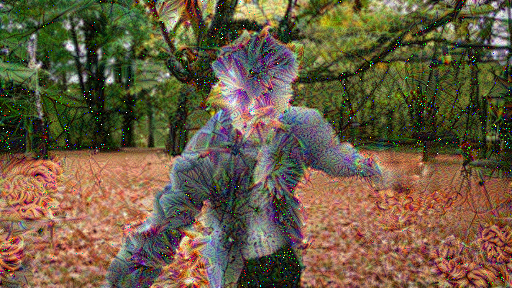

fine-tuned model result

Side-by-side comparison:


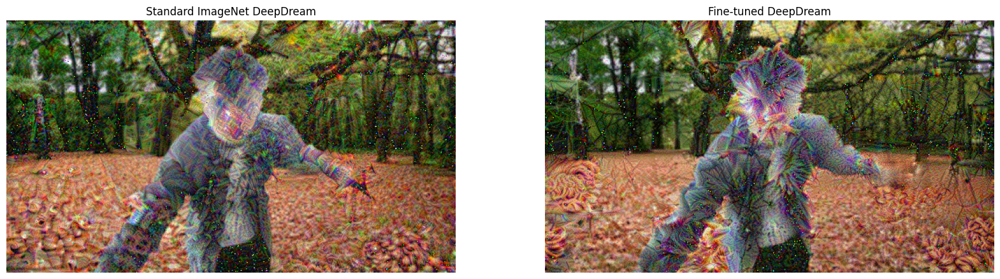

In [24]:
# Run DeepDream with standard ImageNet model
print("\nRunning DeepDream with standard ImageNet model...")
img_standard = run_deep_dream_with_octaves(
    img=original_img,
    model=dream_model_standard,
    steps_per_octave=100, 
    step_size=0.01,
    octave_scale=1.3,
    model_name="Standard ImageNet"
)

# Save the standard model result
display.clear_output(wait=True)
img_standard = tf.image.resize(img_standard, tf.shape(original_img)[:-1], method=tf.image.ResizeMethod.LANCZOS3)
img_standard = tf.image.convert_image_dtype(img_standard/255.0, dtype=tf.uint8)
show(img_standard)
print("Standard ImageNet model result")
PIL.Image.fromarray(np.array(img_standard)).save('standard_model_dream.jpg')

# Run DeepDream with fine-tuned model
print("\nRunning DeepDream with fine-tuned model...")
img_finetuned = run_deep_dream_with_octaves(
    img=original_img,
    model=dream_model_finetuned,
    steps_per_octave=100, 
    step_size=0.01,
    octave_scale=1.3,
    model_name="Fine-tuned"
)

# Save the fine-tuned model result
display.clear_output(wait=True)
img_finetuned = tf.image.resize(img_finetuned, tf.shape(original_img)[:-1], method=tf.image.ResizeMethod.LANCZOS3)
img_finetuned = tf.image.convert_image_dtype(img_finetuned/255.0, dtype=tf.uint8)
show(img_finetuned)
print("fine-tuned model result")
PIL.Image.fromarray(np.array(img_finetuned)).save('finetuned_model_dream.jpg')

# Display both side by side for comparison
print("\nSide-by-side comparison:")
plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
plt.imshow(np.array(img_standard))
plt.title("Standard ImageNet DeepDream")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(np.array(img_finetuned))
plt.title("Fine-tuned DeepDream")
plt.axis('off')
plt.show()

# Enhance Features

Model initialized with layers: ['mixed8', 'mixed9']
Processing at size: (512, 299)
Starting guided dreaming with guidance weight: 0.5
Octaves: 4, Scale: 1.3, Iterations per octave: 150
Using 4 octaves based on image size
Processing octave 1/4 - Size: [299 512]


I0000 00:00:1747053701.742249  583780 cuda_dnn.cc:529] Loaded cuDNN version 90300


  Step 1/150 - Loss: 0.4421
  Step 6/150 - Loss: 0.6500
  Step 11/150 - Loss: 0.8321
  Step 16/150 - Loss: 0.9031
  Step 21/150 - Loss: 1.0095
  Step 26/150 - Loss: 1.0338
  Step 31/150 - Loss: 1.0701
  Step 36/150 - Loss: 1.0622
  Step 41/150 - Loss: 1.1054
  Step 46/150 - Loss: 1.1640
  Step 51/150 - Loss: 1.1365
  Step 56/150 - Loss: 1.2068
  Step 61/150 - Loss: 1.2114
  Step 66/150 - Loss: 1.2285
  Step 71/150 - Loss: 1.2778
  Step 76/150 - Loss: 1.2746
  Step 81/150 - Loss: 1.2959
  Step 86/150 - Loss: 1.2892
  Step 91/150 - Loss: 1.3865
  Step 96/150 - Loss: 1.4083
  Step 101/150 - Loss: 1.3681
  Step 106/150 - Loss: 1.4664
  Step 111/150 - Loss: 1.4981
  Step 116/150 - Loss: 1.5237
  Step 121/150 - Loss: 1.4841
  Step 126/150 - Loss: 1.5161
  Step 131/150 - Loss: 1.5844
  Step 136/150 - Loss: 1.6078
  Step 141/150 - Loss: 1.6226
  Step 146/150 - Loss: 1.6352
Processing octave 2/4 - Size: [230 393]
  Step 1/150 - Loss: 0.9668
  Step 6/150 - Loss: 1.1612
  Step 11/150 - Loss: 1.27

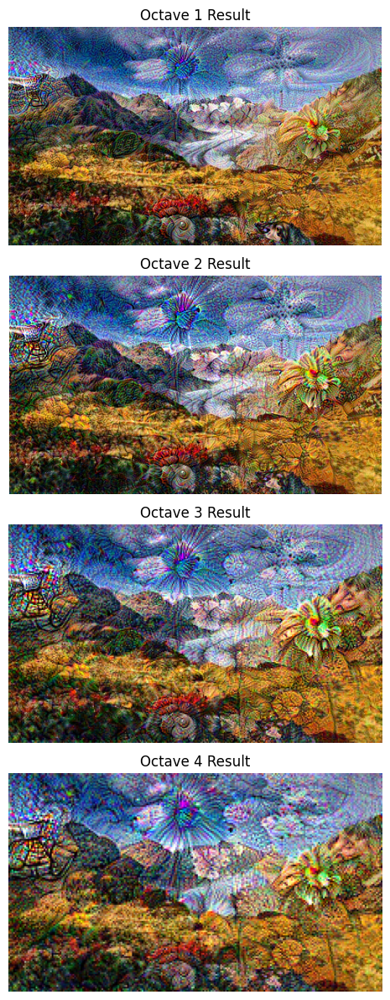

Resizing final result to original dimensions: (512, 288)
Result saved to enhanced_flowers_guided_dream.jpg
Processing completed in 114.65 seconds


In [8]:
if __name__ == "__main__":

    dreamer = GuidedDeepDream(layers=['mixed8', 'mixed9'])
    
    result = dreamer.guided_deepdream(
        base_img_path="pictures/mountains_resized.jpg",
        reference_img_paths=[
            "dream_class_enhancer_images/flowers.png", 
        ],
        output_path="enhanced_flowers_guided_dream.jpg",
        guidance_weight=0.5,
        num_octaves=4,
        octave_scale=1.3,
        iterations_per_octave=150,
        step_size=0.02,
        jitter=16
    )

In [ ]:
if __name__ == "__main__":

    dreamer = GuidedDeepDream(layers=['mixed2', 'mixed3'])
    
    result = dreamer.guided_deepdream(
        base_img_path="pictures/mountains_resized.jpg",
        reference_img_paths=[
            "dream_class_enhancer_images/flowers.png", 
        ],
        output_path="enhanced_flowers_guided_dream.jpg",
        guidance_weight=0.8,
        num_octaves=4,
        octave_scale=1.3,
        iterations_per_octave=150,
        step_size=0.02,
        jitter=16
    )

Model initialized with layers: ['mixed2', 'mixed3']
Processing at size: (512, 299)
Starting guided dreaming with guidance weight: 0.8
Octaves: 4, Scale: 1.3, Iterations per octave: 150
Using 4 octaves based on image size
Processing octave 1/4 - Size: [299 512]
  Step 1/150 - Loss: 2.2546
  Step 6/150 - Loss: 2.6849
  Step 11/150 - Loss: 2.8787
  Step 16/150 - Loss: 2.9614
  Step 21/150 - Loss: 3.0724
  Step 26/150 - Loss: 3.1095
  Step 31/150 - Loss: 3.2328
  Step 36/150 - Loss: 3.2341
  Step 41/150 - Loss: 3.2863
  Step 46/150 - Loss: 3.3091
  Step 51/150 - Loss: 3.4065
  Step 56/150 - Loss: 3.3800
  Step 61/150 - Loss: 3.3299
  Step 66/150 - Loss: 3.4809


## Optimizing octaves

2025-05-12 15:14:02.052431: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-05-12 15:14:02.075115: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1747055642.090845  591615 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1747055642.094825  591615 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1747055642.109416  591615 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking 

I0000 00:00:1747057294.841719  597104 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13512 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 4080, pci bus id: 0000:01:00.0, compute capability: 8.9


Model initialized with layers: ['mixed8', 'mixed9']
Processing at size: (512, 299)


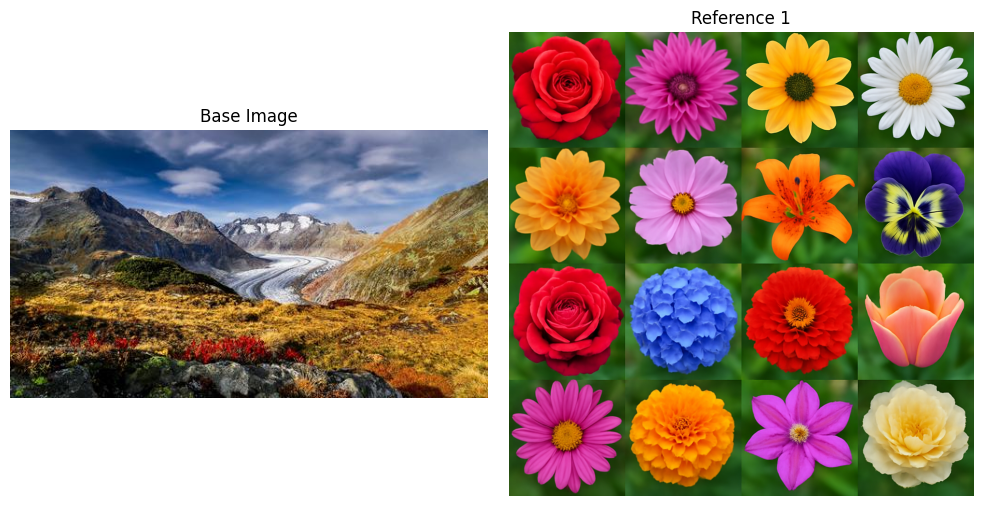

Starting guided dreaming with guidance weight: 0.7
Octaves: 5, Scale: 1.4, Iterations per octave: 200
Using 4 octaves based on image size
Processing octave 1/4 - Size: [108 186]


I0000 00:00:1747057296.832153  597104 cuda_dnn.cc:529] Loaded cuDNN version 90300


  Step 1/200 - Loss: 0.4397
  Step 6/200 - Loss: 0.8171
  Step 11/200 - Loss: 0.9580
  Step 16/200 - Loss: 1.0556
  Step 21/200 - Loss: 1.0928
  Step 26/200 - Loss: 1.1363
  Step 31/200 - Loss: 1.1028
  Step 36/200 - Loss: 1.1483
  Step 41/200 - Loss: 1.1653
  Step 46/200 - Loss: 1.1642
  Step 51/200 - Loss: 1.1865
  Step 56/200 - Loss: 1.1971
  Step 61/200 - Loss: 1.2278
  Step 66/200 - Loss: 1.2047
  Step 71/200 - Loss: 1.2147
  Step 76/200 - Loss: 1.2411
  Step 81/200 - Loss: 1.2489
  Step 86/200 - Loss: 1.2477
  Step 91/200 - Loss: 1.2677
  Step 96/200 - Loss: 1.2247
  Step 101/200 - Loss: 1.2668
  Step 106/200 - Loss: 1.2556
  Step 111/200 - Loss: 1.2887
  Step 116/200 - Loss: 1.2720
  Step 121/200 - Loss: 1.2803
  Step 126/200 - Loss: 1.2924
  Step 131/200 - Loss: 1.3014
  Step 136/200 - Loss: 1.2738
  Step 141/200 - Loss: 1.3002
  Step 146/200 - Loss: 1.2967
  Step 151/200 - Loss: 1.3232
  Step 156/200 - Loss: 1.2778
  Step 161/200 - Loss: 1.3107
  Step 166/200 - Loss: 1.3232
  

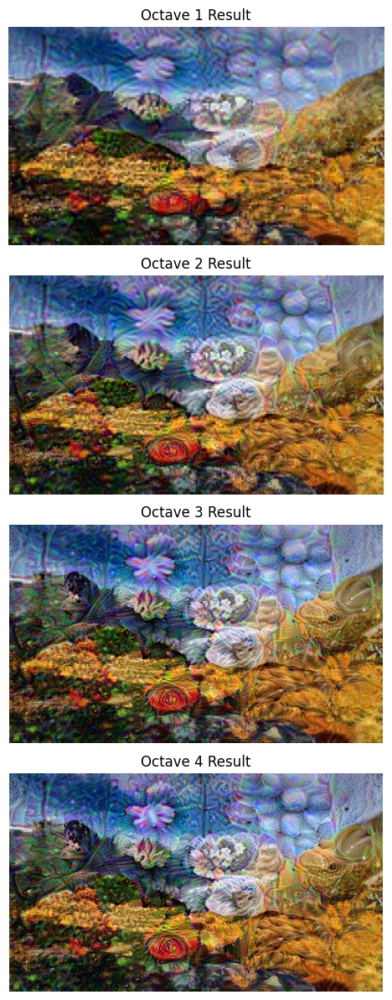

Resizing final result to original dimensions: (512, 288)


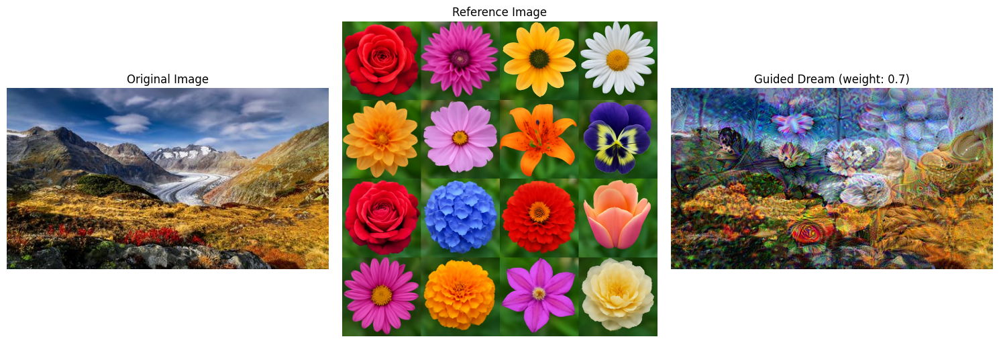

Result saved to improved_dream.jpg
Processing completed in 153.97 seconds


In [6]:
    
# Initialize the model
dreamer = ImprovedGuidedDeepDream(
    model_name='inception_v3',
    layers=['mixed8', 'mixed9']  # You can customize the layers
)

# Apply guided deep dreaming
result = dreamer.guided_deepdream(
    base_img_path="pictures/mountains_resized.jpg",
    reference_img_paths=["dream_class_enhancer_images/flowers.png"],
    output_path='improved_dream.jpg',
    guidance_weight=0.7,        # Adjust guidance weight (0-1)
    octave_scale=1.4,           # Scale between octaves
    num_octaves=5,              # Number of octaves (scales) to process
    iterations_per_octave=200,   # More iterations = more detailed patterns
    step_size=0.01,             # Gradient step size
    jitter=32,                  # Random jitter to prevent artifacts
    display_results=True,       # Show result images
    show_progress=True,         # Show progress during processing
    high_quality=True           # Use higher quality processing
)


Model initialized with layers: ['mixed8', 'mixed9']
Processing at size: (512, 299)


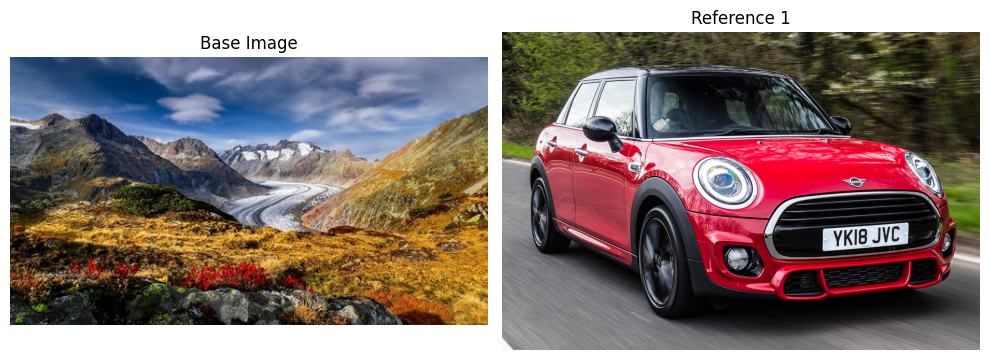

Starting guided dreaming with guidance weight: 0.7
Octaves: 5, Scale: 1.4, Iterations per octave: 200
Using 4 octaves based on image size
Processing octave 1/4 - Size: [108 186]
  Step 1/200 - Loss: 0.4154
  Step 6/200 - Loss: 0.4938
  Step 11/200 - Loss: 0.4556
  Step 16/200 - Loss: 0.7559
  Step 21/200 - Loss: 0.8314
  Step 26/200 - Loss: 1.0339
  Step 31/200 - Loss: 1.0760
  Step 36/200 - Loss: 1.1423
  Step 41/200 - Loss: 1.1645
  Step 46/200 - Loss: 1.2986
  Step 51/200 - Loss: 1.3306
  Step 56/200 - Loss: 1.2479
  Step 61/200 - Loss: 1.2084
  Step 66/200 - Loss: 1.2898
  Step 71/200 - Loss: 1.2448
  Step 76/200 - Loss: 1.3638
  Step 81/200 - Loss: 1.2653
  Step 86/200 - Loss: 1.2999
  Step 91/200 - Loss: 1.3964
  Step 96/200 - Loss: 1.3409
  Step 101/200 - Loss: 1.3897
  Step 106/200 - Loss: 1.2907
  Step 111/200 - Loss: 1.3897
  Step 116/200 - Loss: 1.3667
  Step 121/200 - Loss: 1.4857
  Step 126/200 - Loss: 1.4600
  Step 131/200 - Loss: 1.4437
  Step 136/200 - Loss: 1.3704
  St

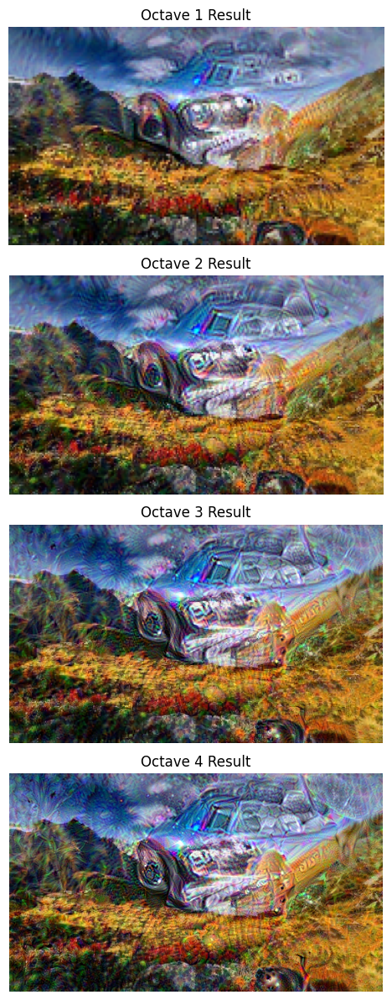

Resizing final result to original dimensions: (512, 288)


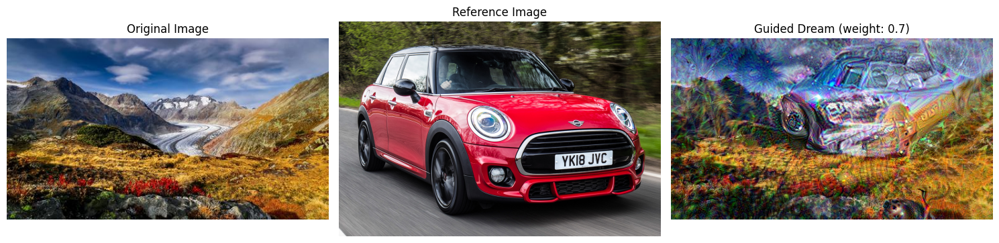

Result saved to improved_dream.jpg
Processing completed in 145.94 seconds


In [ ]:
dreamer = ImprovedGuidedDeepDream(
    model_name='inception_v3',
    layers=['mixed8', 'mixed9'] 
)

# Apply guided deep dreaming
result = dreamer.guided_deepdream(
    base_img_path="pictures/mountains_resized.jpg",
    reference_img_paths=["dream_class_enhancer_images/car2.jpg"],
    output_path='improved_dream.jpg',
    guidance_weight=0.7,        # Adjust guidance weight (0-1)
    octave_scale=1.4,           # Scale between octaves
    num_octaves=5,              # Number of octaves (scales) to process
    iterations_per_octave=200,   # More iterations = more detailed patterns
    step_size=0.01,             # Gradient step size
    jitter=32,                  # Random jitter to prevent artifacts
    display_results=True,       # Show result images
    show_progress=True,         # Show progress during processing
    high_quality=True           # Use higher quality processing
)
